In [1]:
%load_ext autoreload
%autoreload 2

Add some explaining text ....

In [2]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf

init_notebook_mode(connected=False)
cf.go_offline()

In [3]:
%matplotlib inline

In [4]:
import os
import pandas as pd
from text2topics import models

In [5]:
data_dir = "/Users/jeriwieringa/Dissertation/data/"
output_dir = "/Users/jeriwieringa/Dissertation/site/files/interact/"

In [6]:
data = os.path.join(data_dir, "model_outputs", "target_300_10.18497.state.gz")

In [7]:
mallet_model = models.MalletModel(data)

In [8]:
df = mallet_model.model()
params = mallet_model.extract_params()

In [9]:
doc_topic = df.groupby(['#doc', 'topic'])['type'].count().reset_index(name="token_count")

In [10]:
#sanity check
models.pivot_smooth_norm(doc_topic, params[0], '#doc', 'topic', 'token_count')[:10]

topic,0,1,2,3,4,5,6,7,8,9,...,240,241,242,243,244,245,246,247,248,249
#doc,,,,,,,,,,,,,,,,,,,,,
0,0.000247,0.000077,0.000303,0.000252,0.000168,0.000858,0.000106,0.000355,0.000158,0.000083,...,0.000093,0.000146,0.000120,0.000251,0.000099,0.008392,0.000134,0.000146,0.000133,0.000091
1,0.000279,0.000087,0.000343,0.000285,0.037680,0.010343,0.000120,0.000402,0.000178,0.000094,...,0.000106,0.000165,0.000135,0.000284,0.000112,0.000121,0.000151,0.000165,0.000150,0.000103
2,0.000265,0.000082,0.000325,0.000269,0.000180,0.009792,0.000113,0.000381,0.159891,0.000089,...,0.000100,0.000157,0.000128,0.000269,0.000106,0.000115,0.000143,0.000157,0.000142,0.000098
3,0.000293,0.000091,0.000360,0.000299,0.000200,0.001018,0.000125,0.000422,0.000187,0.000098,...,0.000111,0.000173,0.000142,0.000298,0.000118,0.000127,0.000159,0.000174,0.000158,0.000109
4,0.000237,0.000074,0.055981,0.000242,0.000162,0.000824,0.000101,0.000341,0.000151,0.000080,...,0.000090,0.000140,0.000115,0.008196,0.000095,0.000103,0.000128,0.000140,0.000128,0.000088
5,0.000253,0.000079,0.000311,0.000258,0.000173,0.000880,0.000108,0.000365,0.025651,0.000085,...,0.000096,0.000150,0.000123,0.000257,0.000102,0.000110,0.000137,0.000150,0.000136,0.000094
6,0.000233,0.015735,0.000287,0.000238,0.000159,0.000811,0.000100,0.000336,0.000149,0.000078,...,0.000088,0.000138,0.000113,0.000237,0.000094,0.000101,0.000126,0.000138,0.000126,0.000086
7,0.000210,0.000065,0.000258,0.000214,0.000143,0.000731,0.000090,0.007360,0.000134,0.000071,...,0.000079,0.000125,0.000102,0.000214,0.077715,0.000091,0.000114,0.000125,0.000113,0.000078
8,0.000237,0.000074,0.000291,0.000242,0.000162,0.000824,0.000101,0.000341,0.000151,0.000080,...,0.000090,0.000140,0.000115,0.000241,0.000095,0.000103,0.000128,0.000140,0.000128,0.000088


In [11]:
# Load metadata

metadata = pd.read_csv(os.path.join(data_dir, "corpus_metadata", "meta.csv"), header=None).reset_index()
metadata.columns = ['doc_id', 'filename', 'citation', 'author', 
                    'periodical_name', 'volume', 'issue', 
                    'date', 'page', 'url','abrev']
metadata['date_formatted'] = pd.to_datetime(metadata['date'])

In [12]:
# Load Labels

import gspread
from oauth2client.service_account import ServiceAccountCredentials

# Load data from Google Doc
scope = ['https://spreadsheets.google.com/feeds']
secrets = "/Users/jeriwieringa/Dissertation/dev/code/secrets/dissertation-881847769b13.json"
credentials = ServiceAccountCredentials.from_json_keyfile_name(secrets, scope)
gc = gspread.authorize(credentials)
dts = gc.open('Topic Labels').sheet1

labels = pd.DataFrame(dts.get_all_records())

In [13]:
denom_titles = ['RH', 'ST', 'ARAI', 'GCB', 'PTAR','TCOG']
denom = models.subset_by_titles(doc_topic, metadata, denom_titles, params[0])

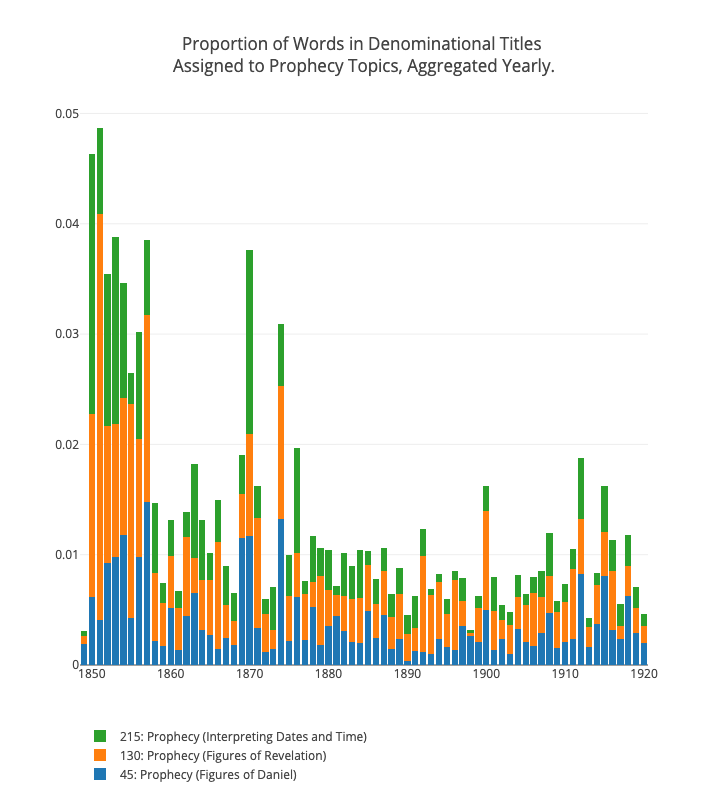

In [14]:
prophecy_denom = models.generate_graph_data(denom, ['prophecy'], labels)
models.generate_visualizations(prophecy_denom, 
                              'Denominational Titles', 'Prophecy Topics',
                              output_dir
                             )

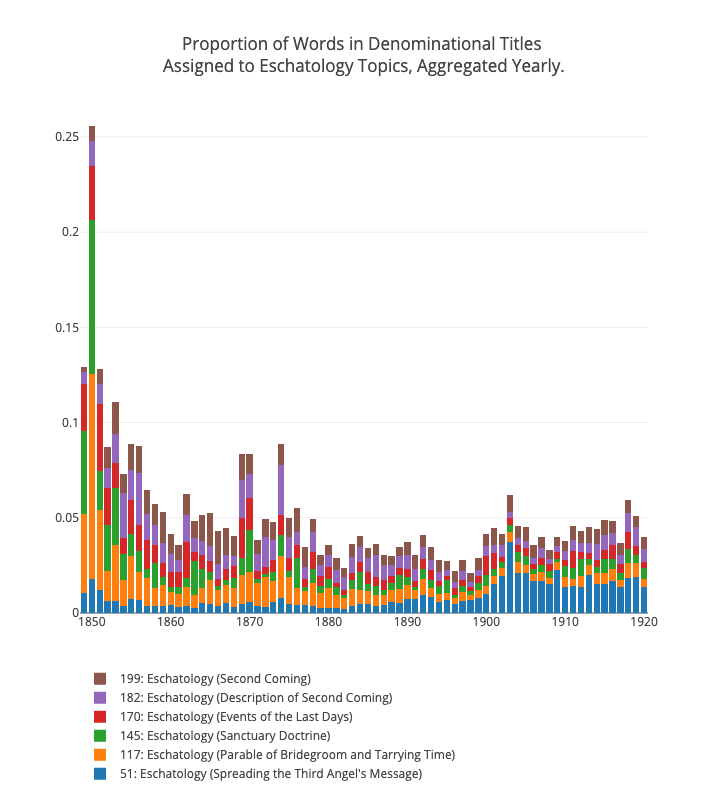

In [15]:
esch_denom = models.generate_graph_data(denom, ['eschatology'], labels)
models.generate_visualizations(esch_denom, 
                              'Denominational Titles', 'Eschatology Topics', 
                              output_dir
                             )

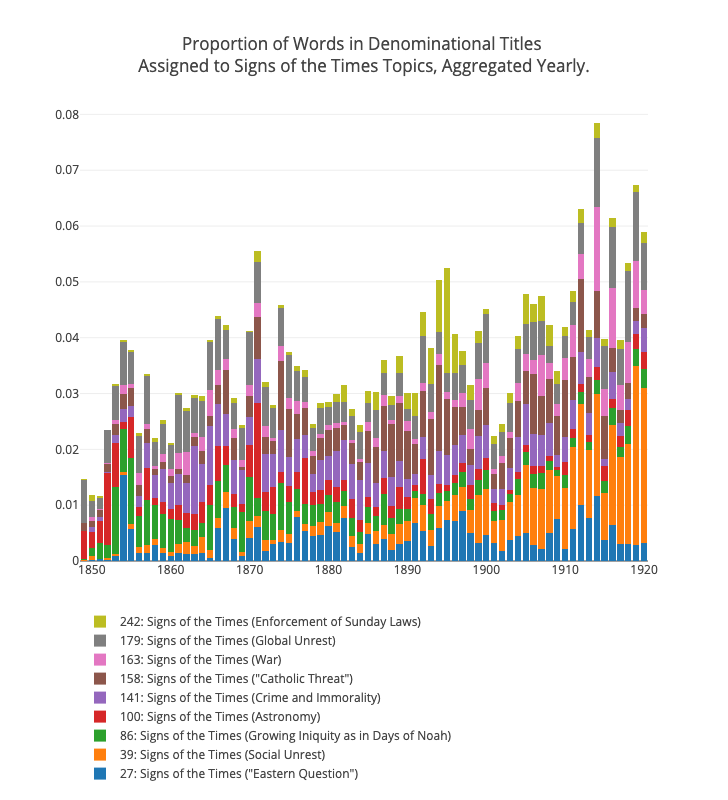

In [16]:
signs_denom = models.generate_graph_data(denom, ['signs_of_the_times'], labels)
models.generate_visualizations(signs_denom, 
                              'Denominational Titles', 'Signs of the Times Topics', 
                              output_dir
                             )

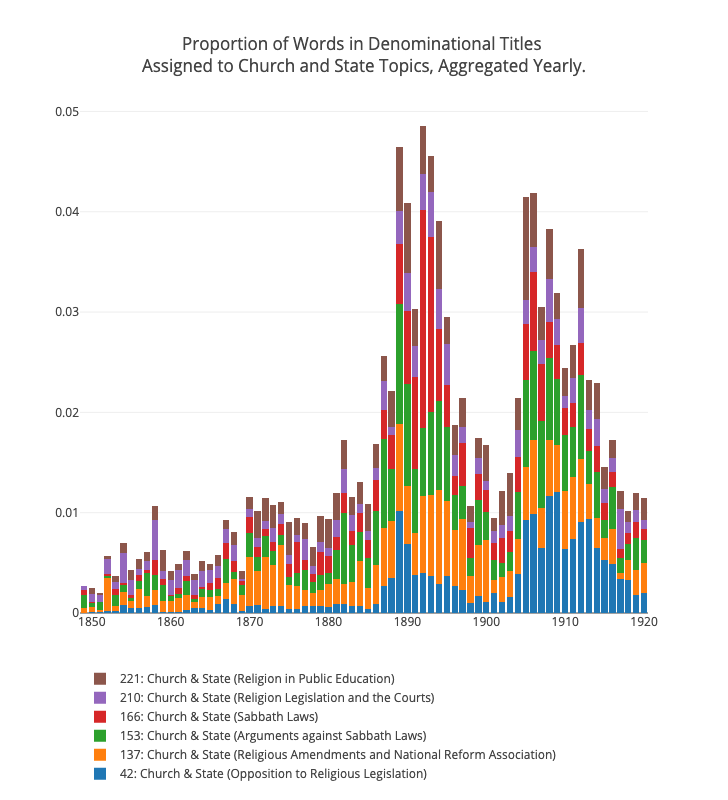

In [17]:
church_denom = models.generate_graph_data(denom, ['church_and_state'], labels)
models.generate_visualizations(church_denom, 
                              'Denominational Titles', 'Church and State Topics', 
                              output_dir
                             )

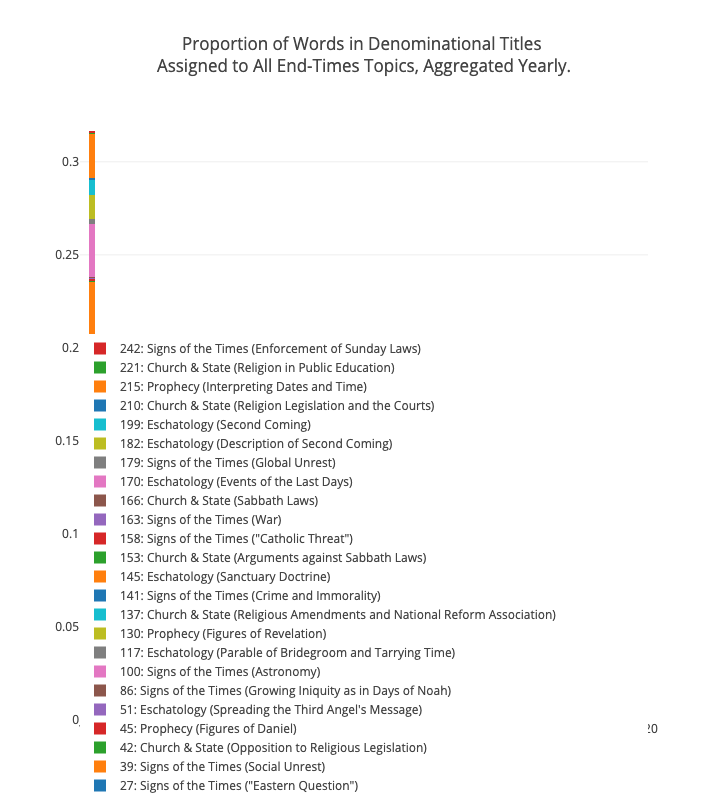

In [18]:
endTimes_denom = models.generate_graph_data(denom, 
                                           ['prophecy', 'eschatology', 'signs_of_the_times', 'church_and_state'], 
                                           labels)
models.generate_visualizations(endTimes_denom, 
                              'Denominational Titles', 'All End-Times Topics', 
                              output_dir
                             )

## Process full corpus (excluding YI)

In [19]:
# Full Corpus excludes 'YI' because of the spotty coverage and distinctive vocabulary
titles = metadata['abrev'].unique().tolist()
titles.remove('YI')

full_corpus = models.subset_by_titles(doc_topic, metadata, titles, params[0])

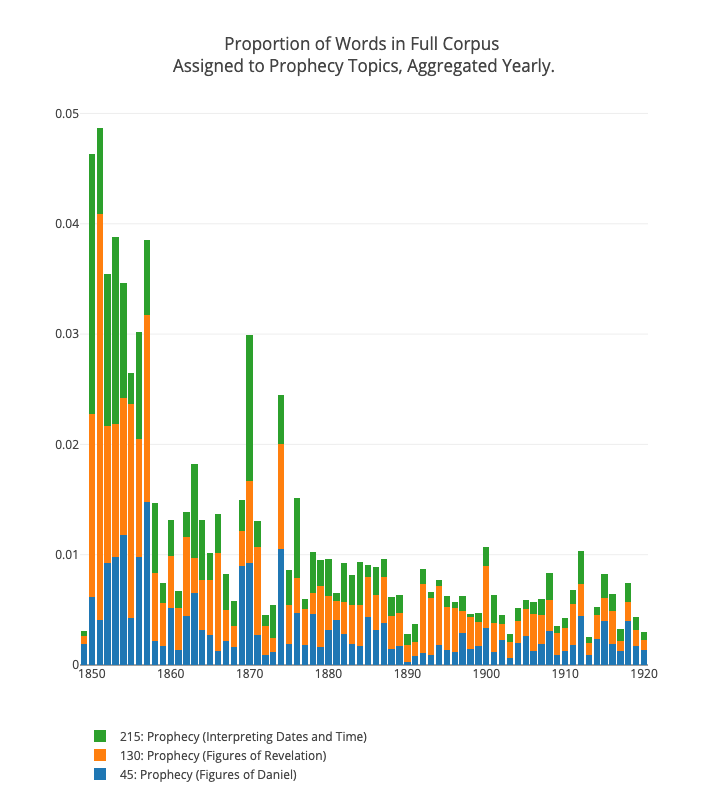

In [20]:
prophecy_full = models.generate_graph_data(full_corpus, ['prophecy'], labels)
models.generate_visualizations(prophecy_full, 
                              'Full Corpus', 'Prophecy Topics',
                              output_dir
                             )

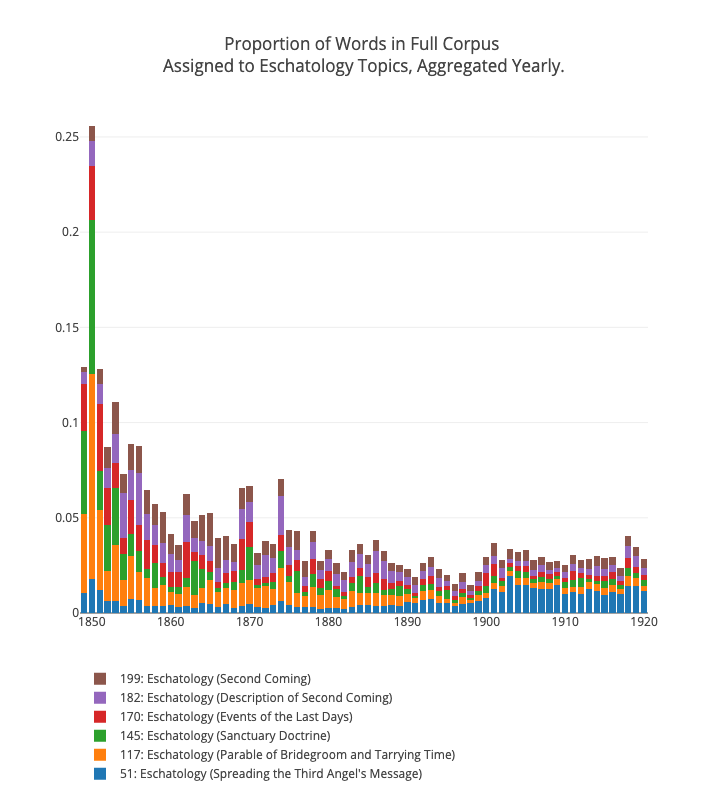

In [21]:
esch_full = models.generate_graph_data(full_corpus, ['eschatology'], labels)
models.generate_visualizations(esch_full, 
                              'Full Corpus', 'Eschatology Topics',
                              output_dir
                             )

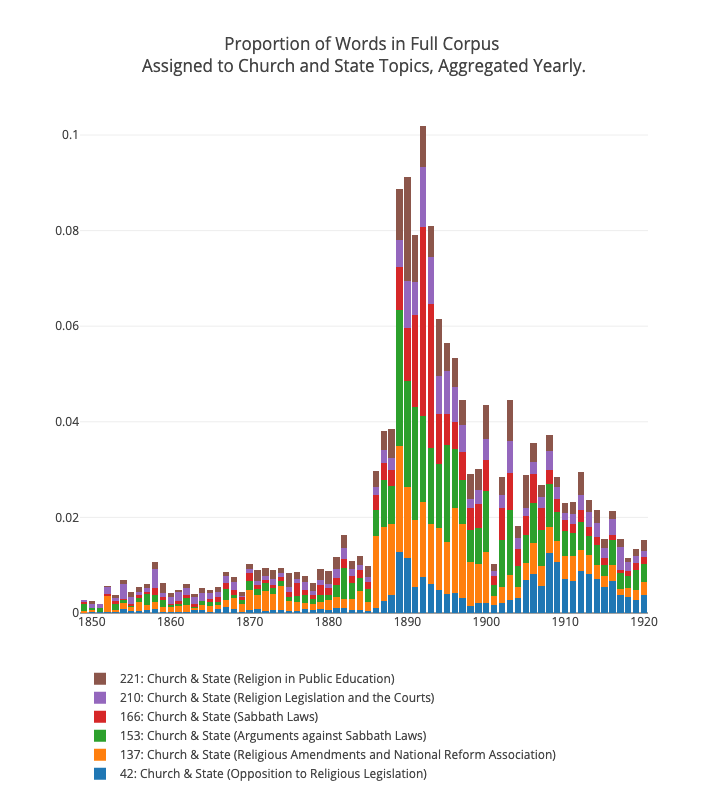

In [22]:
church_full = models.generate_graph_data(full_corpus, ['church_and_state'], labels)
models.generate_visualizations(church_full, 
                              'Full Corpus', 'Church and State Topics',
                              output_dir
                             )

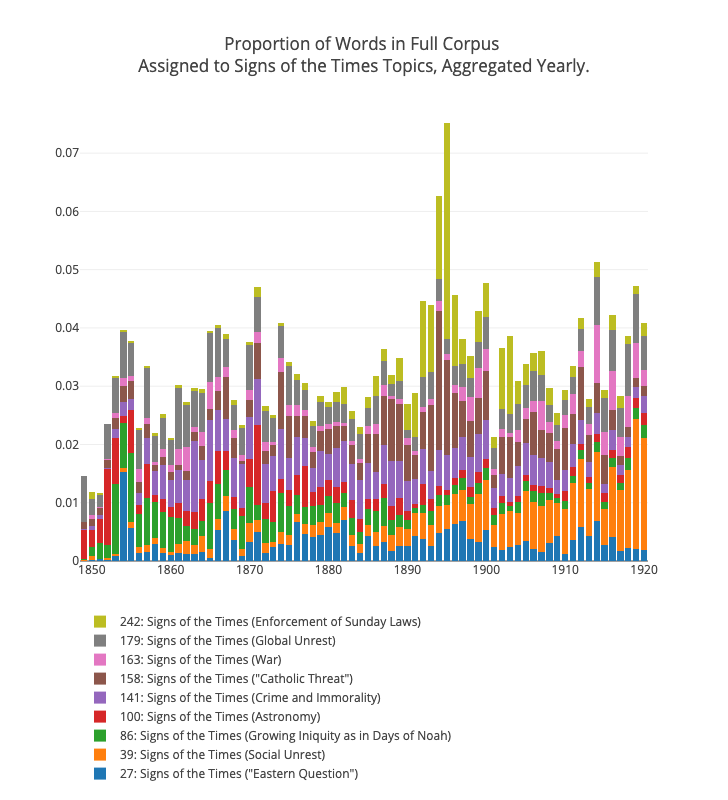

In [23]:
signs_full = models.generate_graph_data(full_corpus, ['signs_of_the_times'], labels)
models.generate_visualizations(signs_full, 
                              'Full Corpus', 'Signs of the Times Topics',
                              output_dir
                             )

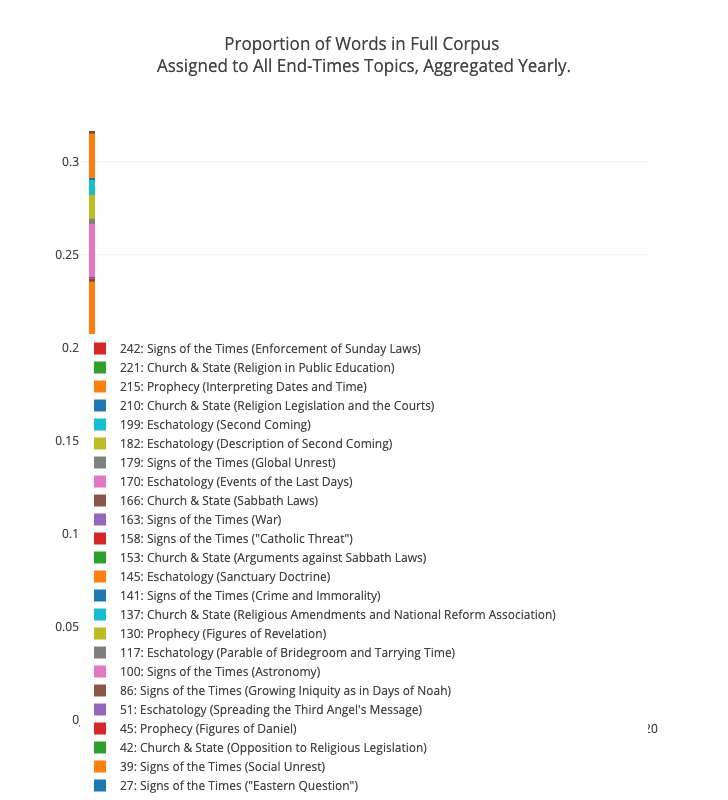

In [24]:
endTimes_full = models.generate_graph_data(full_corpus, 
                                           ['prophecy', 'eschatology', 'signs_of_the_times', 'church_and_state'], 
                                           labels)
models.generate_visualizations(endTimes_full, 
                              'Full Corpus', 'All End-Times Topics', 
                              output_dir
                             )

Experiment with using lable for all topics chart (too much detail with all the topics).

what data do I need?
- aggregated topic prevalence for label
- prep that for bar graph

Where is the data? - full_corpus (this has been normed on the year)



In [25]:
full_corpus[:10]

topic,0,1,2,3,4,5,6,7,8,9,...,240,241,242,243,244,245,246,247,248,249
date_formatted,,,,,,,,,,,,,,,,,,,,,
1849,0.000466,0.002586,0.001395,0.003516,0.010145,0.004582,0.001459,0.007097,0.000664,6.630487e-07,...,0.000995,0.000532,0.000067,0.000334,7.931035e-07,8.578557e-07,0.000001,0.000001,0.000200,7.317510e-07
1850,0.000748,0.000168,0.017215,0.002281,0.017356,0.010193,0.004587,0.017163,0.001495,1.032088e-04,...,0.004613,0.002564,0.001134,0.000954,5.169408e-05,6.459166e-05,0.000142,0.000155,0.000116,3.093819e-04
1851,0.000168,0.000088,0.012642,0.000423,0.008307,0.005930,0.003075,0.026111,0.001330,1.762721e-04,...,0.007153,0.000326,0.000326,0.001410,1.586710e-04,1.773238e-05,0.000088,0.000308,0.000027,2.291364e-04
1852,0.000167,0.000035,0.005281,0.001515,0.007970,0.005372,0.001744,0.007477,0.002126,9.241767e-04,...,0.001591,0.000167,0.000063,0.003620,4.934035e-04,2.093442e-05,0.000042,0.000160,0.000049,3.057964e-04
1853,0.000172,0.000177,0.004123,0.005804,0.014792,0.009618,0.004503,0.007720,0.002175,7.067793e-04,...,0.016509,0.000535,0.000231,0.001767,6.800938e-05,1.269083e-04,0.000141,0.000068,0.000168,5.119791e-04
1854,0.000371,0.000064,0.006968,0.005771,0.014992,0.006641,0.002876,0.004330,0.001102,2.825367e-04,...,0.011030,0.002079,0.000324,0.001863,4.447696e-05,1.333580e-04,0.000248,0.000070,0.000067,1.016099e-04
1855,0.000287,0.000017,0.005469,0.006721,0.016765,0.007997,0.001198,0.009276,0.002825,2.318219e-04,...,0.007935,0.001065,0.000259,0.002367,1.380224e-04,3.869919e-05,0.001159,0.000215,0.000088,2.759737e-04
1856,0.000356,0.000066,0.005137,0.005642,0.016413,0.007067,0.006419,0.017270,0.003977,6.013867e-04,...,0.013017,0.000106,0.000449,0.002120,1.030340e-04,5.652370e-05,0.000498,0.000116,0.000070,1.362549e-04
1857,0.000114,0.000129,0.006746,0.007267,0.013650,0.008857,0.003065,0.014193,0.007135,1.769910e-04,...,0.005354,0.000633,0.000360,0.003278,2.103126e-05,8.402032e-05,0.000540,0.000144,0.000099,1.709955e-04


In [26]:
def aggregate_on_topic_category(df, topic_list):
    data = df.unstack().reset_index(name='t_proportion')\
            .merge(labels, how='left', left_on="topic", right_on="mallet_topic_id")\
            [['topic', 'date_formatted', 't_proportion', 'topic_category', 'topic_label']]
    agg_data = data.groupby(['date_formatted', 'topic_category'])['t_proportion']\
            .sum()\
            .reset_index(name="agg_topic_proportion")
    return agg_data[agg_data['topic_category'].isin(topic_list)]

In [27]:
import plotly.graph_objs as go

def generate_graph_data(df):
    """
    """
    # Compile into form for Plotly
    data = []
    for each in df['topic_category'].unique():
        filtered = df[df['topic_category'] == each]
        graph_obj = go.Bar(
            x = filtered['date_formatted'],
            y = filtered['agg_topic_proportion'],
            name = ''.join(filtered['topic_category'].unique())
        )
        data.append(graph_obj)
    
    return data

In [28]:
agg_end_times = aggregate_on_topic_category(full_corpus,
                                            ['prophecy', 
                                             'eschatology', 
                                             'signs_of_the_times', 
                                             'church_and_state'
                                            ])

In [29]:
agg_end_times[:5]

,date_formatted,topic_category,agg_topic_proportion
3,1849,church_and_state,0.002725
8,1849,eschatology,0.129428
21,1849,prophecy,0.003118
26,1849,signs_of_the_times,0.014663
36,1850,church_and_state,0.002488


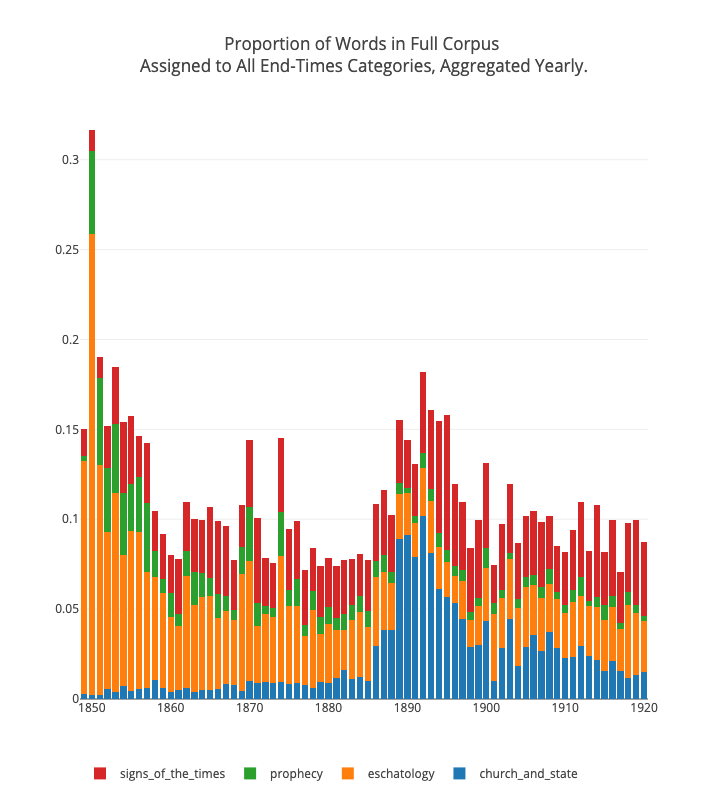

In [30]:
models.generate_visualizations(generate_graph_data(agg_end_times), 
                            'Full Corpus', 
                            'All End-Times Categories', 
                            output_dir)

In [31]:
denom_data = aggregate_on_topic_category(denom,
                                            ['prophecy', 
                                             'eschatology', 
                                             'signs_of_the_times', 
                                             'church_and_state'
                                            ])

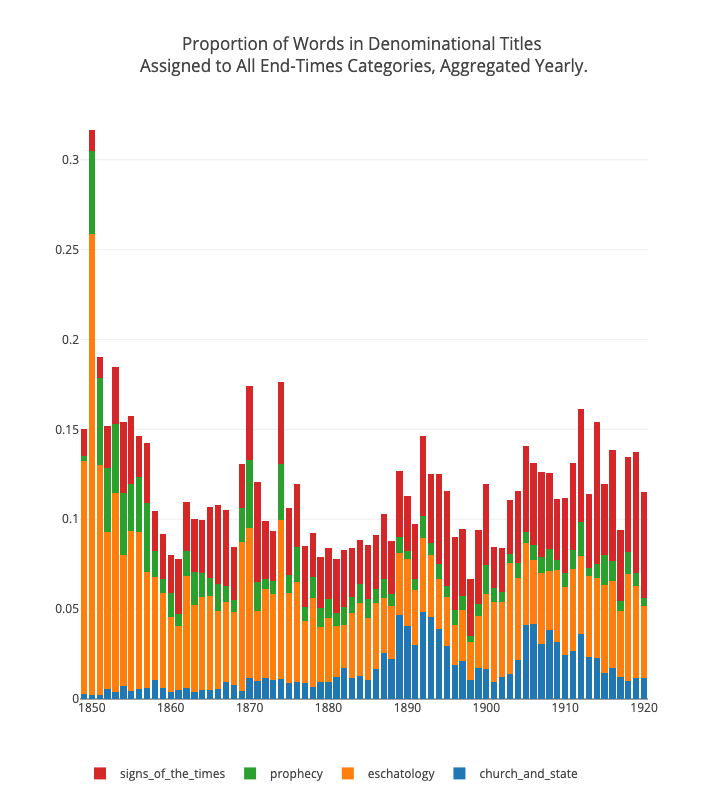

In [32]:
models.generate_visualizations(generate_graph_data(denom_data),
                            'Denominational Titles', 
                             'All End-Times Categories',
                              output_dir
                             )